In [17]:
import os
import math
import random
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset, random_split
from torch.optim import SGD, AdamW
import torchvision
from torchvision.transforms import ConvertImageDtype, Compose, ToTensor
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scipy.signal as sig
import seaborn as sns
import numpy as np
import cv2
import pandas as pd
from tqdm import tqdm


In [1]:
dataset = "/media/magalhaes/vision/1668780086_split_1.txt"

In [3]:
def avg_brightness(rgb_image):
    # Convert image to HSV
    hsv = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HSV)

    # Add up all the pixel values in the V channel
    sum_brightness = np.sum(hsv[:,:,2])
    area = rgb_image.shape[0] * rgb_image.shape[1]  # pixels
    avg = sum_brightness/area
    
    return avg

In [26]:
def estimate_noise(I, plot=False):
     # https://www.sciencedirect.com/science/article/abs/pii/S1077314296900600
     # Compute Fast Noise Variance Estimation for each channel independently
     # A Fast Method For Image Noise Estimation Using Laplacian Operator and Adaptive Edge Detection 
     H, W, C = I.shape
     sigma = 0
     I = np.einsum("hwc->chw", I)
     # for c in range(3):
     #      # if plot:
     #      #      fig, axs = plt.subplots(1,4, figsize=(25,10))
     #      #      axs[0].imshow(I[c])
     #      # if plot:
     #      #      axs[1].imshow(I[c],cmap='gray', vmin=0, vmax=255)
     #      # # I = 0.5 * np.clip(np.absolute(sig.convolve2d(I, Ex)) + 0.5* np.absolute(sig.convolve2d(I, Ey)), 0, 255)
     #      # v = np.absolute(cv2.Sobel(src=I[c], ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5))
     #      # if plot:
     #      #      axs[2].imshow(v,cmap='gray', vmin=0, vmax=255)
     #      # v = np.absolute(cv2.Laplacian(v, ddepth=cv2.CV_64F, ksize=3))
     #      # if plot:
     #      #      axs[3].imshow(v,cmap='gray', vmin=0, vmax=255)

     #      M = [[1, -2, 1],
     #           [-2, 4, -2],
     #           [1, -2, 1]]
     #      if plot:
     #           plt.imshow(np.absolute(sig.convolve2d(I[c], M)))
     #      sigma += np.sum(np.sum(np.absolute(sig.convolve2d(I[c], M))))
     sigma = np.sum(np.sum(np.absolute(cv2.Laplacian(I, ddepth=cv2.CV_64F, ksize=3))))
     sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))

     return sigma

In [58]:
def luma_var(img):
    img = np.einsum("hwc->chw", img)
    r_var = np.std(img[0].flatten(), axis=-1)
    g_var = np.std(img[1].flatten(), axis=-1)
    b_var = np.std(img[2].flatten(), axis=-1)
    r_g_cov = np.sum(np.linalg.eig(np.cov(img[0].flatten(), img[1].flatten()))[0]) / 2
    r_b_cov = np.sum(np.linalg.eig(np.cov(img[0].flatten(), img[2].flatten()))[0]) / 2
    b_g_cov = np.sum(np.linalg.eig(np.cov(img[1].flatten(), img[2].flatten()))[0]) / 2
    return r_var + g_var + b_var + r_g_cov + r_b_cov + b_g_cov

In [59]:
images_paths = []
images = []
avg_brightness_arr = []
noise_arr = []
luma_arr = []

for image_path in open(dataset).readlines():
    image_path = image_path.strip()
    if "schreder" in image_path:
        img = mpimg.imread(image_path)
        img = cv2.resize(img, (640, 480))
        images_paths.append(image_path)
        images.append(img)
        avg_brightness_arr.append(avg_brightness(img)) 
        luma_arr.append(luma_var(img))
        # noise_arr.append(estimate_noise(img))

In [3]:
class DayNightDataset(Dataset):
    def __init__(self, csv_path):
        self.img_labels = pd.read_csv(csv_path)
        self.images_path = self.img_labels.iloc[:, 0]
        self.labels_str = self.img_labels.iloc[:, 1]
        self.labels = [1 if label == "day" else 0  for label in self.labels_str]
        self.images = [np.einsum("hwc->chw", cv2.resize(cv2.imread(path), (64,64))).astype('float32') / 255 for path in self.images_path]
        assert len(self.images) == len(self.labels)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], torch.tensor([self.labels[idx]], dtype=torch.float32)

In [7]:
def create_daynight_model(weights_path=None):
    # model = torchvision.models.mobilenet_v3_small(pretrained=weights_path is None)
    # Freeze all layers
    # for p in model.parameters():
    #     p.requires_grad = False 
    # model.classifier = nn.Sequential(
    #         nn.LazyLinear(1024),
    #         nn.ReLU(),
    #         nn.Linear(1024, 1),
    #         nn.Sigmoid(),
    #     )
    model = nn.Sequential(
        nn.Conv2d(3, 6, kernel_size=3),
        nn.AvgPool2d(4, 1),
        nn.Conv2d(6, 16, kernel_size=3),
        nn.AvgPool2d(4, 1),
        nn.Flatten(),
        nn.LazyLinear(256),
        nn.ReLU(),
        nn.Linear(256, 1),
        nn.Sigmoid()
    )
    # Except our new classifier layer
    # for p in model.classifier.parameters():
    #     p.requires_grad = True

    if weights_path is not None:
        model.load_state_dict(torch.load(weights_path))

    return model

In [4]:
def is_balanced(subset):
    if subset is None:
        return False
    total = 0.0
    night = 0.0
    for i in subset.indices:
        total += 1
        if subset.dataset[i][1] == 0:
            night += 1
    return 0.3 < night / total < 0.7

In [8]:
def train_daynight_model(n_epochs=1000, device="cuda:0"):
    model = create_daynight_model()
    model.to(device)

    loss_values = []

    loss_fn = nn.BCELoss()
    optimizer = AdamW(model.parameters(), lr=0.0001)

    train_dataset = DayNightDataset("../yolo/data/day_night.csv")
    # train_dataset = None
    # while not is_balanced(train_dataset):
    #     train_dataset, test_dataset = random_split(dataset, [math.ceil(len(dataset)/2), math.floor(len(dataset)/2)])
    train_dataloader = DataLoader(train_dataset, batch_size=12, shuffle=True)
    # test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset))

    i = 0
    for epoch in tqdm(range(n_epochs)):
        for image, label in train_dataloader:
            pred = model(image.to(device))

            loss = loss_fn(pred, label.to(device))
            if i % 10 == 0:
                loss_values.append(loss.item())

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            i += 1
    
    plt.plot(loss_values)

    conf_thres = 0.5

    # model.eval()
    # with torch.no_grad():
    #     correct = 0.0
    #     total = 0.0
    #     for image, label in test_dataloader:
    #         pred = model(image.to(device)).cpu()

    #         total += pred.shape[0]
    #         pred[pred < conf_thres] = 0
    #         pred[pred >= conf_thres] = 1
    #         correct += (torch.all(pred == label, dim=-1).type(torch.int8)).sum().item()
    #     print(f"Test Accuracy: {correct/total}")

    torch.save(model.state_dict(), "/media/magalhaes/vision/cnn_day_night.pth")
    

/home/guests/msg/.conda/envs/thesis/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
100%|██████████| 1000/1000 [00:20<00:00, 49.04it/s]


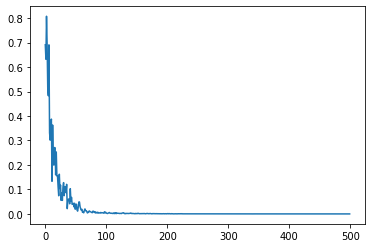

In [9]:
train_daynight_model()

In [5]:
def daynight_datasets(model_path, dataset, device="cuda:0"):
    day = []
    night = []

    threshold = 0.5

    model = create_daynight_model(model_path)
    model.to(device)

    convert_image = Compose([ToTensor(), ConvertImageDtype(torch.float32)])  
    
    with torch.no_grad():
        for image_path in open(dataset).readlines():
            image_path = image_path.strip()
            if "schreder" in image_path:
                image = convert_image(cv2.resize(cv2.imread(image_path), (64,64))).unsqueeze(0).to(device)
                pred = model(image).cpu()
                # day
                if pred > threshold:
                    day.append(image_path + "\n")
                else:
                    night.append(image_path + "\n")

    day_file_path = dataset.split(".")[0] + "_day.txt"
    night_file_path = dataset.split(".")[0] + "_night.txt"
    with open(day_file_path, "w") as fp:
        fp.writelines(day)

    with open(night_file_path, "w") as fp:
        fp.writelines(night)  



In [32]:
daynight_datasets("/media/magalhaes/vision/cnn_day_night.pth", "/media/magalhaes/vision/1668780086.txt")

/home/guests/msg/.conda/envs/thesis/lib/python3.9/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [19]:
day_examples = ["d6_1944_19833", "d6_13595_2789", "d5_486_25943", "d5_929_15105"]
night_examples = ["d1_1216_2342", "d1_3008_7714", "d6_2769_11619", "d5_3012_17717", "d4_5113_4464", "d3_30018_11480"]
rain = [""]

In [57]:
luma_var(mpimg.imread("/media/magalhaes/schreder/d6/images/d6_1944_19833.jpg"))

17113.334560404153

In [8]:
estimate_noise(mpimg.imread("/media/magalhaes/schreder/d1/images/d1_1216_2342.jpg"), plot=True)

3284.3919851372134

559.2594570231031

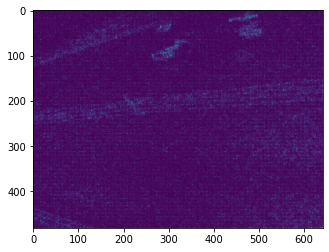

In [21]:
estimate_noise(mpimg.imread("/media/magalhaes/schreder/d6/images/d6_2769_11619.jpg"), plot=True)

699.4763225523726

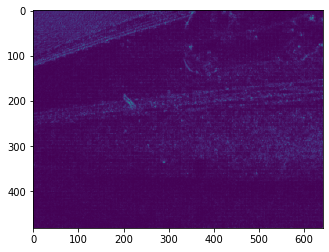

In [22]:
estimate_noise(mpimg.imread("/media/magalhaes/schreder/d6/images/d6_1944_19833.jpg"), plot=True)

## Attempt 1

<BarContainer object of 470 artists>

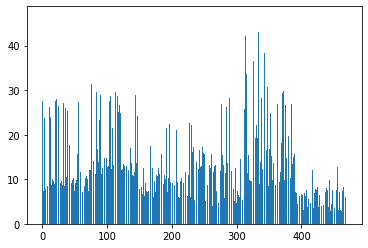

In [9]:
plt.bar(x=[i for i in range(len(noise_arr))], height=noise_arr)

<BarContainer object of 470 artists>

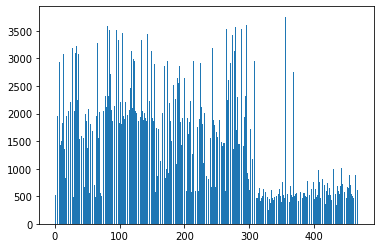

In [20]:
plt.bar(x=[i for i in range(len(noise_arr))], height=noise_arr)

<BarContainer object of 470 artists>

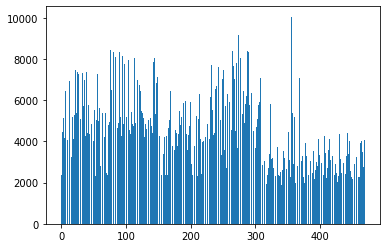

In [95]:
plt.bar(x=[i for i in range(len(noise_arr))], height=noise_arr)

<BarContainer object of 470 artists>

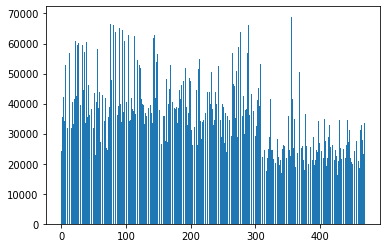

In [107]:
plt.bar(x=[i for i in range(len(noise_arr))], height=noise_arr)

<BarContainer object of 470 artists>

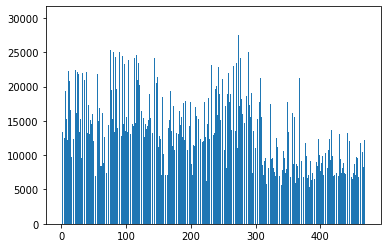

In [28]:
plt.bar(x=[i for i in range(len(noise_arr))], height=noise_arr)

## Brightness

<BarContainer object of 470 artists>

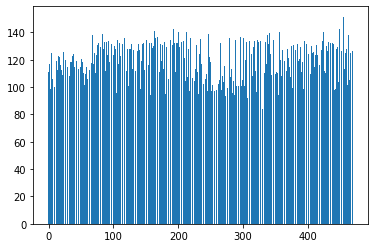

In [10]:
plt.bar(x=[i for i in range(len(avg_brightness_arr))], height=avg_brightness_arr)

## Luma

<BarContainer object of 470 artists>

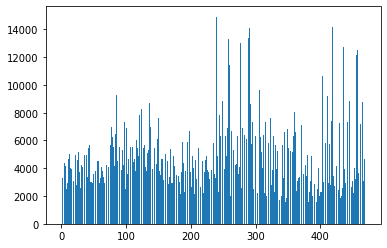

In [60]:
plt.bar(x=[i for i in range(len(luma_arr))], height=luma_arr)

In [29]:
filter_noise_indexes = []
noise_threshold = 15000
for i in range(len(noise_arr)):
    if noise_arr[i] > noise_threshold:
        filter_noise_indexes.append(i)

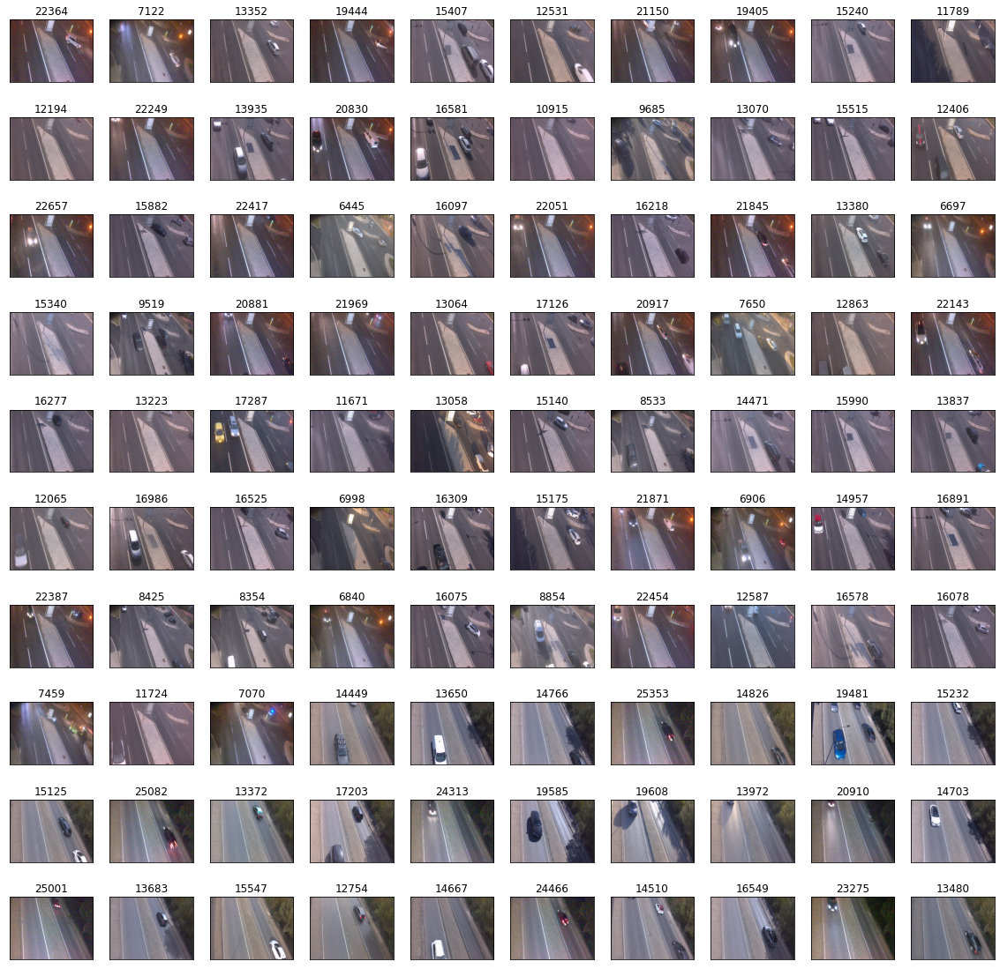

In [37]:
fig, axs = plt.subplots(10,10, figsize=(20,20))
offset = 100
for i in range(10):
    for j in range(10):
        # k = filter_noise_indexes[i * 10 + j]
        k = i * 10 + j
        axs[i,j].imshow(images[k])
        axs[i,j].set(title=f"{int(noise_arr[k])}")
        axs[i,j].set_xticks([])
        axs[i,j].set_yticks([])

In [61]:
filter_luma_indexes = []
luma_threshold = 5000
for i in range(len(luma_arr)):
    if luma_arr[i] > luma_threshold:
        filter_luma_indexes.append(i)

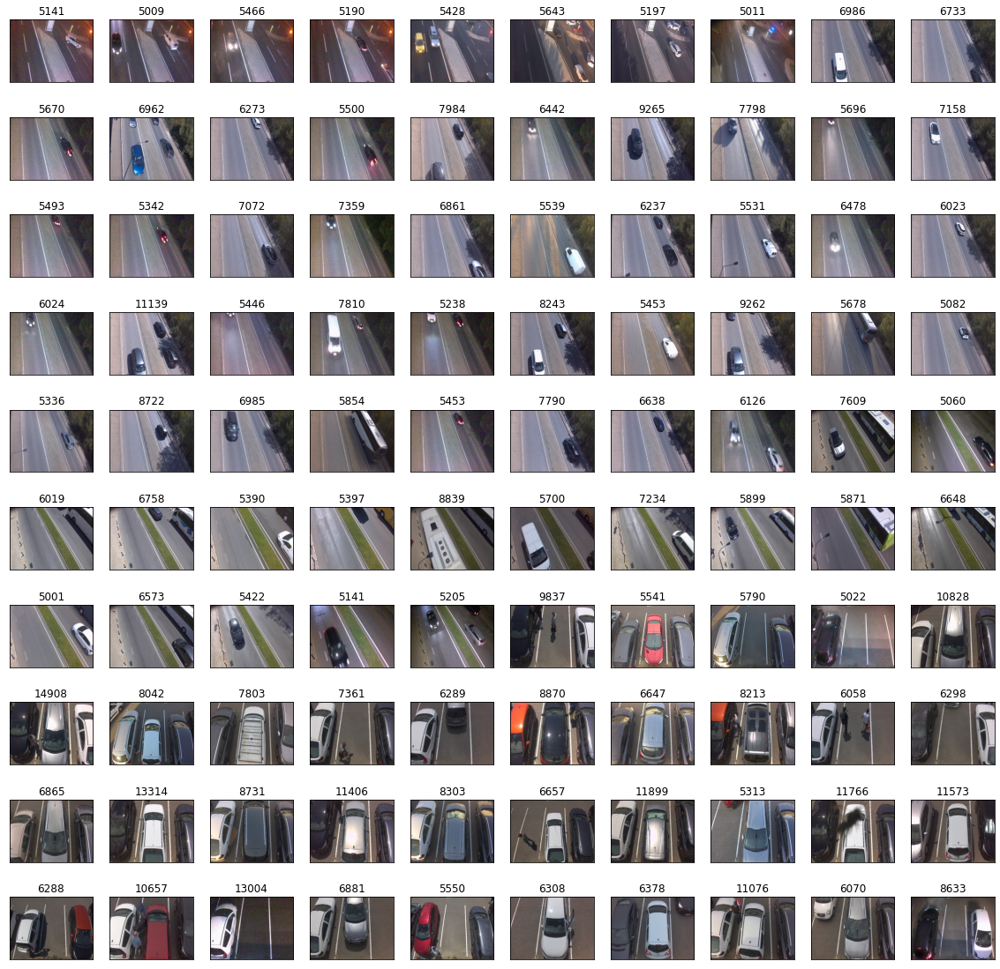

In [63]:
fig, axs = plt.subplots(10,10, figsize=(20,20))
offset = 100
for i in range(10):
    for j in range(10):
        k = filter_luma_indexes[i * 10 + j]
        axs[i,j].imshow(images[k])
        axs[i,j].set(title=f"{int(luma_arr[k])}")
        axs[i,j].set_xticks([])
        axs[i,j].set_yticks([])

In [27]:
def view_images(path):
    images_paths = []
    for i in open(path).readlines():
        if i.strip() == "":
            continue
        images_paths.append(i.strip())
    
    images_paths = random.sample(images_paths, 100)

    fig, axs = plt.subplots(10,10, figsize=(20,20))
    offset = 100
    for i in range(100):
        k = i % 10
        j = i // 10
        axs[k,j].imshow(mpimg.imread(images_paths[i]))
        axs[k,j].set(title=f"{os.path.basename(images_paths[i])[:-4]}")
        axs[k,j].set_xticks([])
        axs[k,j].set_yticks([])
    plt.show()

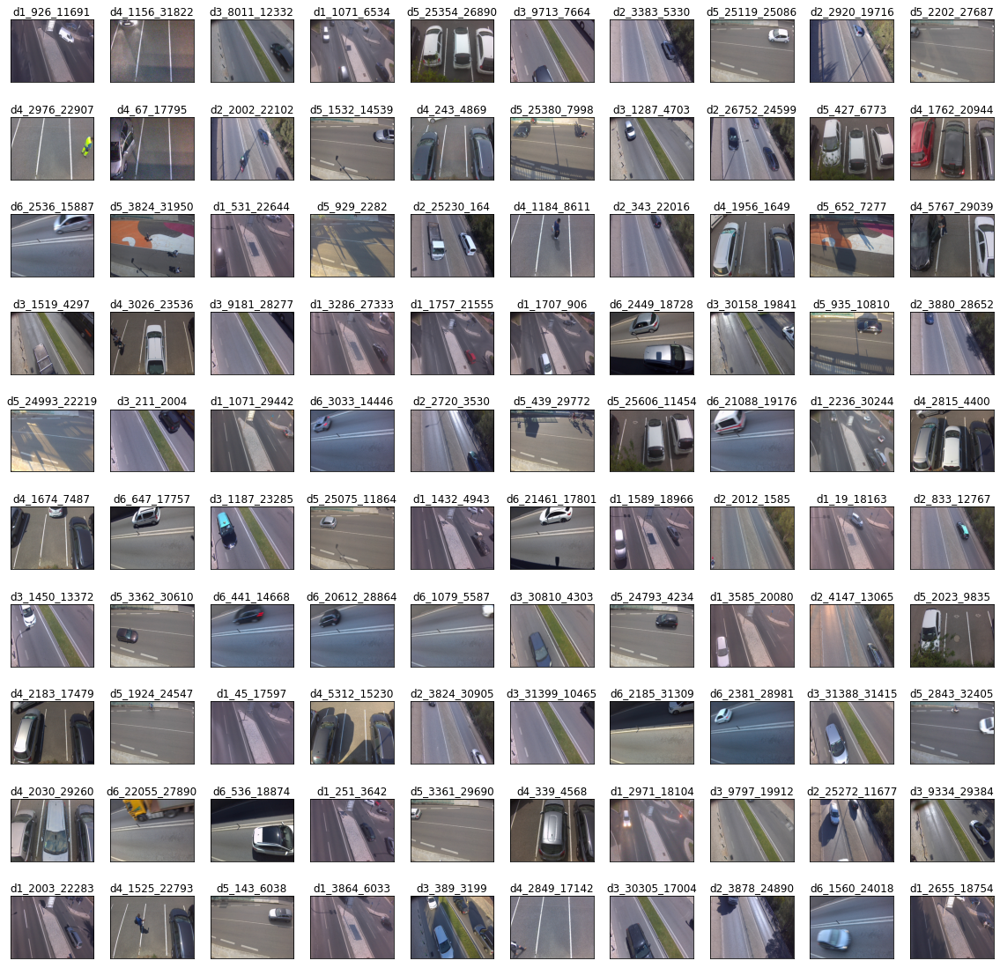

In [28]:
view_images("/media/magalhaes/vision/1668780086_split_1_day.txt")

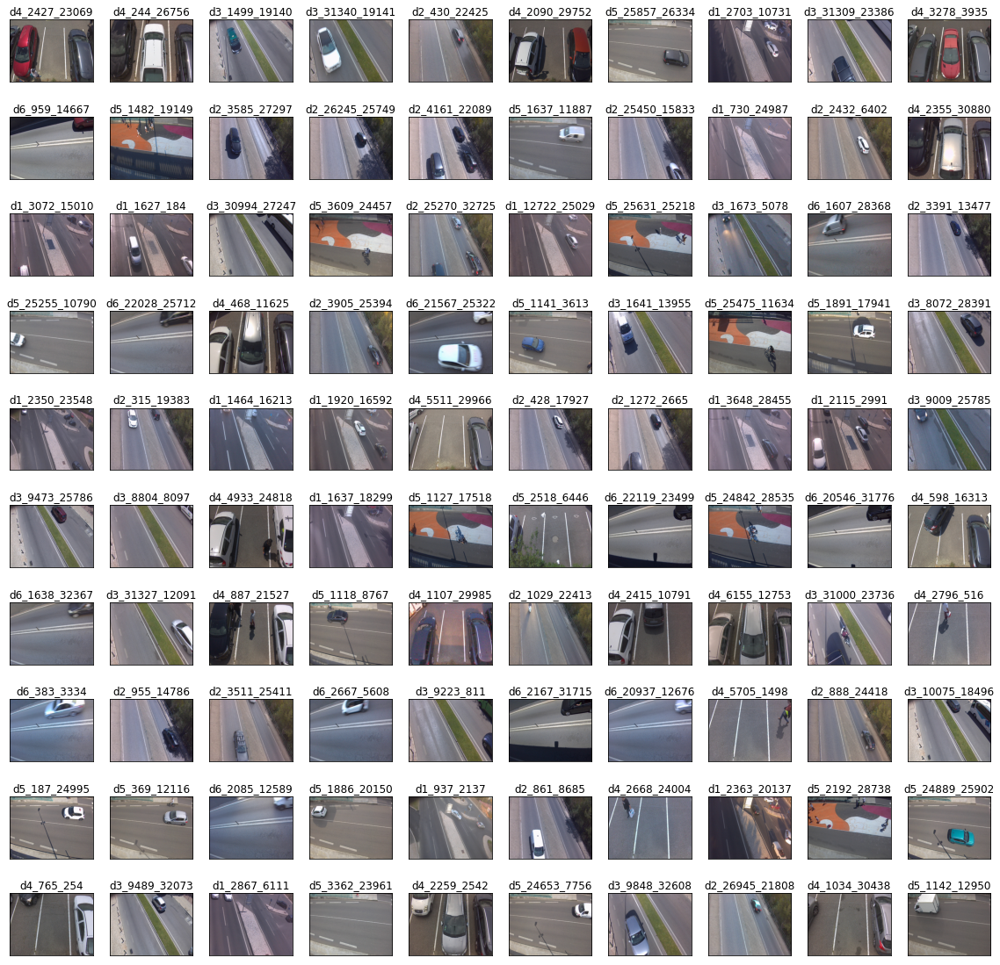

In [29]:
view_images("/media/magalhaes/vision/1668780086_split_2_day.txt")

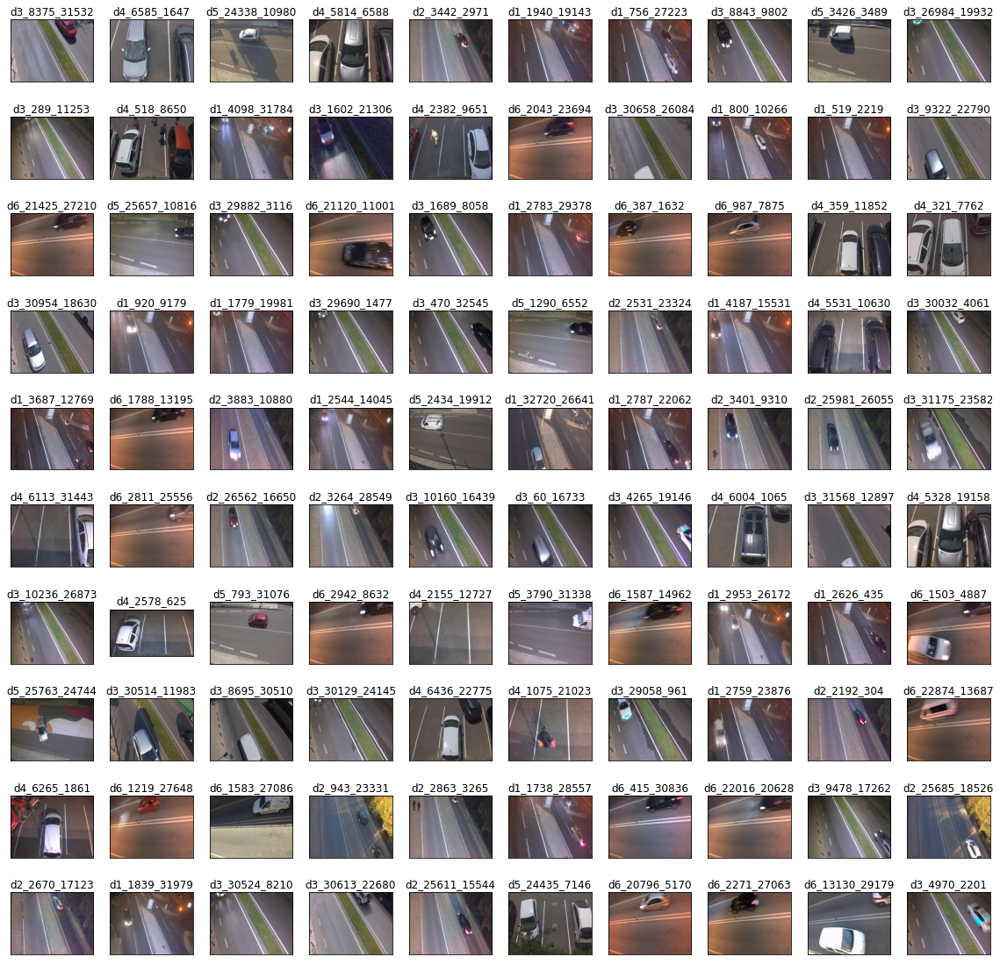

In [30]:
view_images("/media/magalhaes/vision/1668780086_split_1_night.txt")

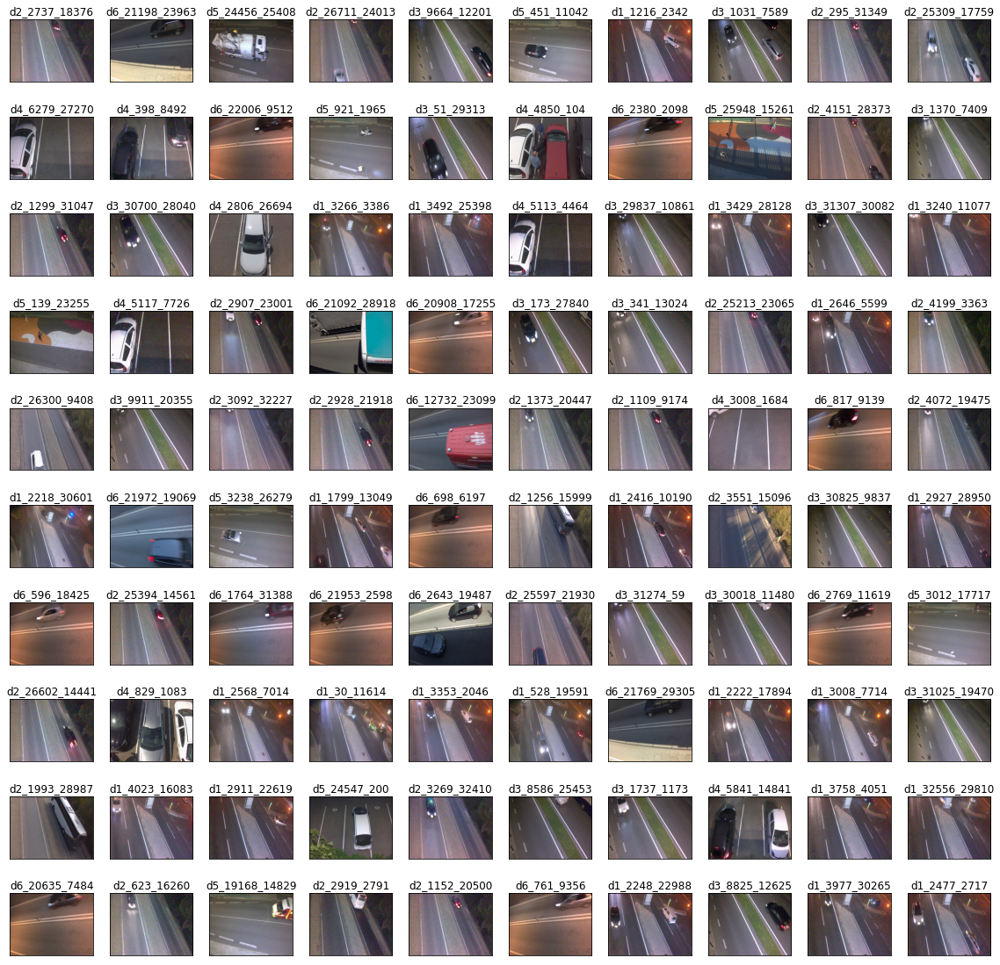

In [31]:
view_images("/media/magalhaes/vision/1668780086_split_2_night.txt")